In [1]:
import cv2 as cv
import  numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.transform import warp
from skimage.registration import optical_flow_ilk
from skimage.io import imread
from skimage.transform import resize

In [2]:
# read the images
frame0 = imread('./images/frame0.jpg')
frame1 = imread('./images/frame1.jpg')

In [3]:
#convert the RGC frames to grayscale
frame0 = rgb2gray(frame0) 
frame1 = rgb2gray(frame1)

In [4]:
# calculate optical flow
v,u = optical_flow_ilk(frame0, frame1)

In [5]:
# warp the second image back to the first
nr, nc = frame0.shape
row_coords, col_coords = np.meshgrid(np.arange(nr), np.arange(nc), indexing='ij')
frame1_warp = warp(frame1, np.array([row_coords + v, col_coords + u]), mode='edge')

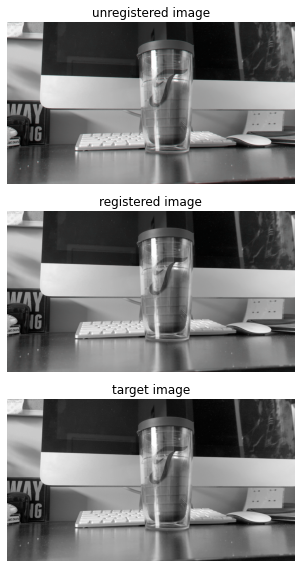

In [6]:
# show the unregistered image -> we will use the first channel for the second frame
seq_im = np.zeros((nr, nc, 3))
seq_im[...,0] = frame1
seq_im[...,1] = frame0
seq_im[...,2] = frame0
# shwo the registered image -> we will use the first channel for the warped image of the second frame
reg_im = np.zeros((nr, nc, 3))
reg_im[:,:,0] = frame1_warp
reg_im[:,:,1] = frame0
reg_im[:,:,2] = frame0
# target image would look this way -> This to compare with the registered image
target_im = np.zeros((nr, nc, 3))
target_im[:,:,0] = frame0
target_im[:,:,1] = frame0
target_im[:,:,2] = frame0

#show the result

fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(20, 8))

ax0.imshow(seq_im)
ax0.set_title('unregistered image')
ax0.set_axis_off()

ax1.imshow(reg_im)
ax1.set_title('registered image')
ax1.set_axis_off()

ax2.imshow(target_im)
ax2.set_title('target image')
ax2.set_axis_off()

fig.tight_layout()

In [7]:
#get the images in the frames folder
import os
frames = os.listdir('./images')
#sort them accirdng to their names and numbers in alphanumerical order
from natsort import natsorted

frames = natsorted(frames)
frames.remove('cropped_object.jpg')

frame0.jpg


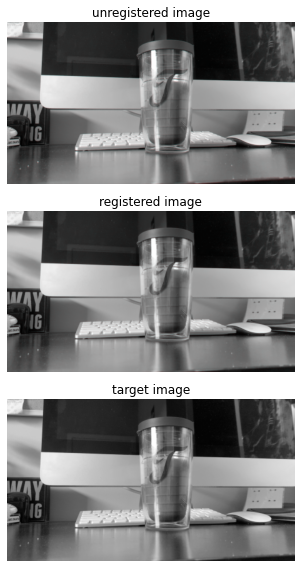

frame1.jpg


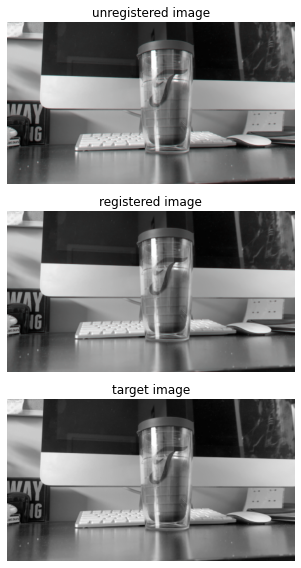

frame2.jpg


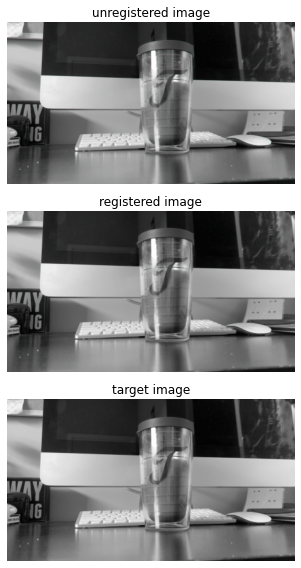

frame3.jpg


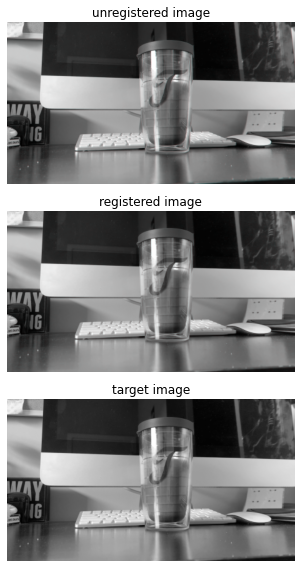

frame4.jpg


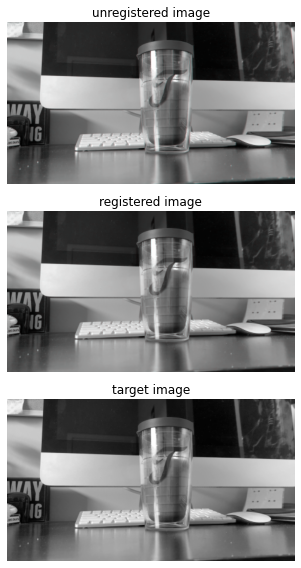

frame5.jpg


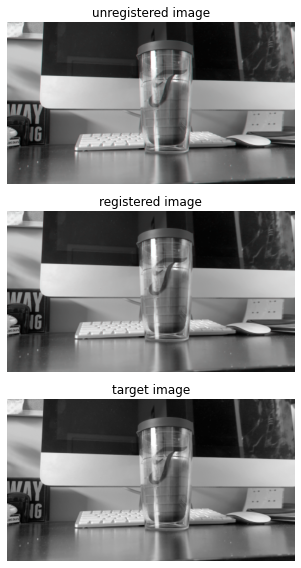

frame6.jpg


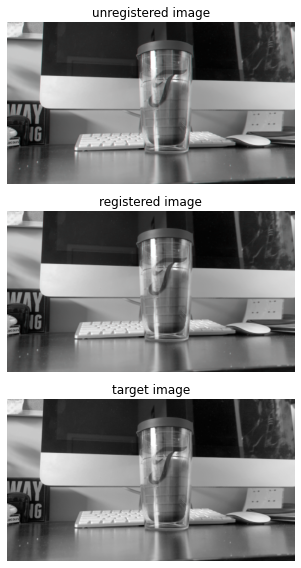

frame7.jpg


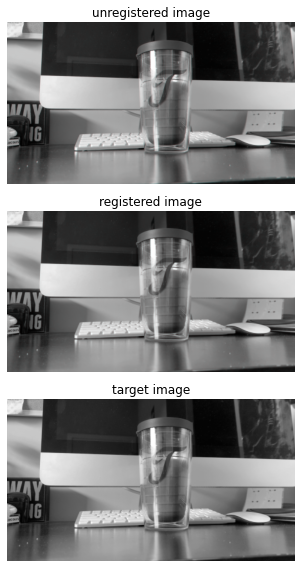

frame8.jpg


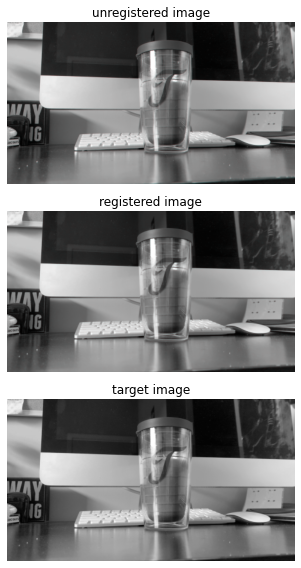

frame9.jpg


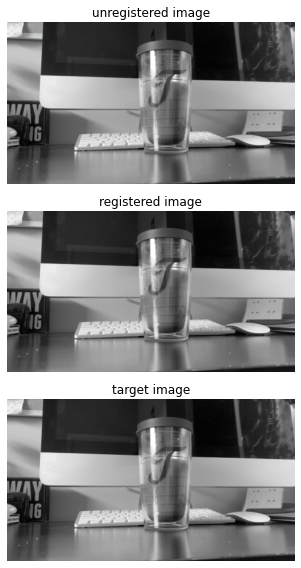

frame10.jpg


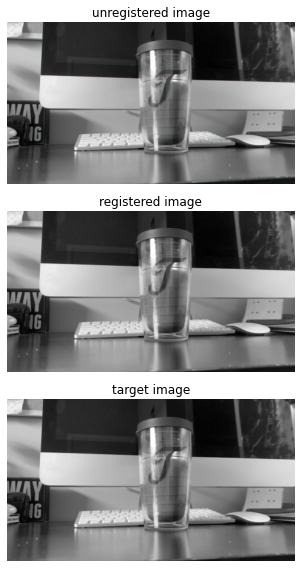

frame11.jpg


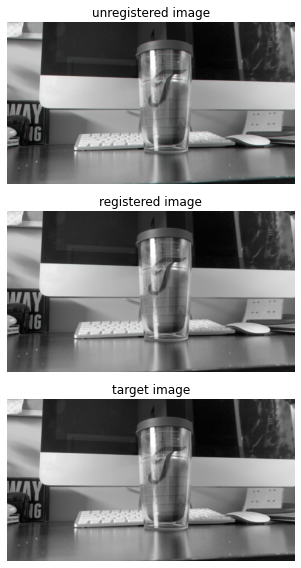

frame12.jpg


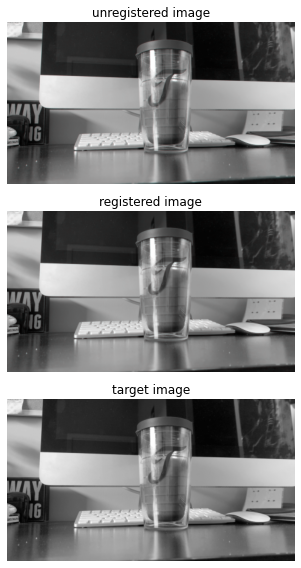

frame13.jpg


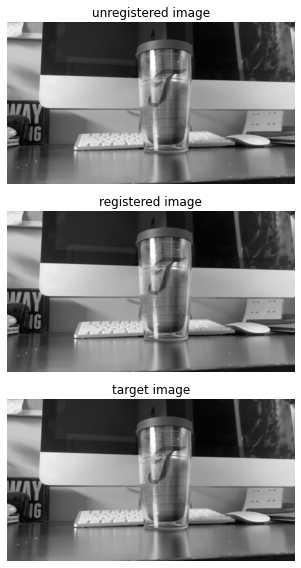

frame14.jpg


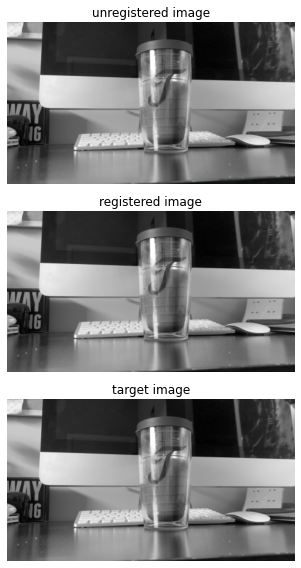

frame15.jpg


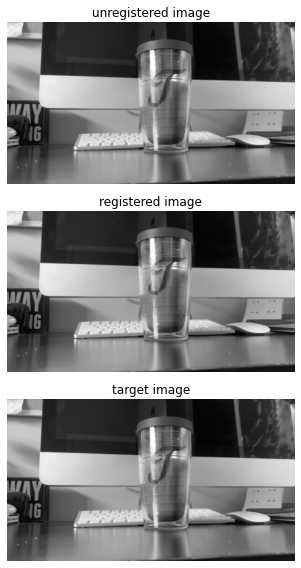

frame16.jpg


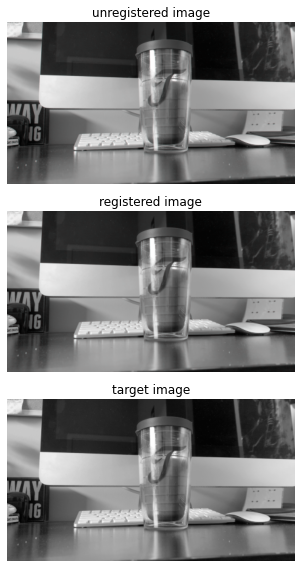

frame17.jpg


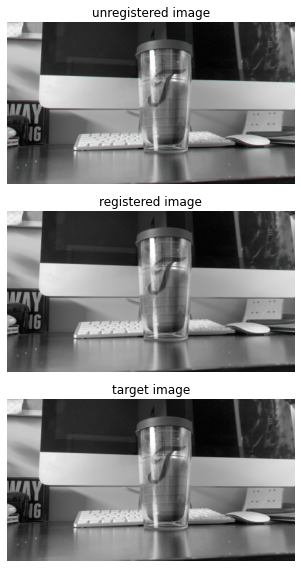

frame18.jpg


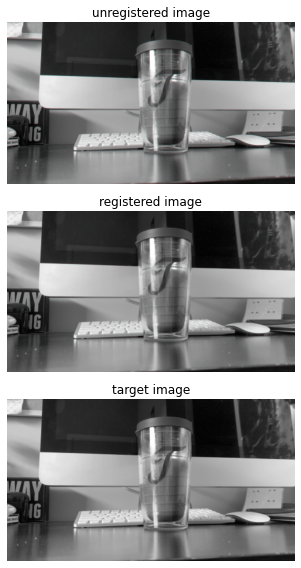

frame19.jpg


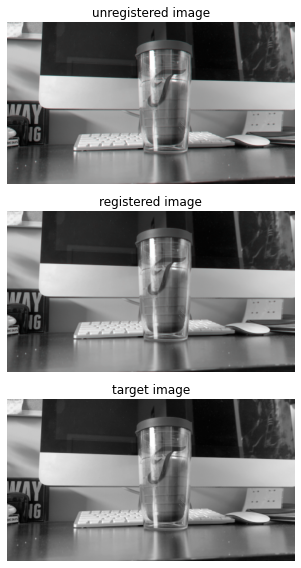

frame20.jpg


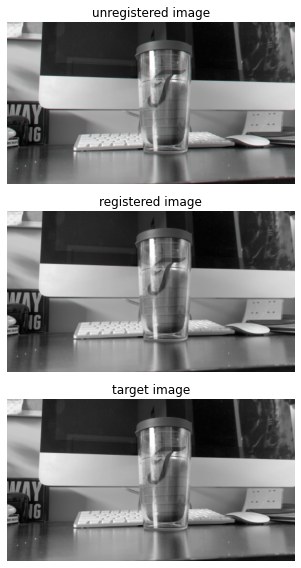

frame21.jpg


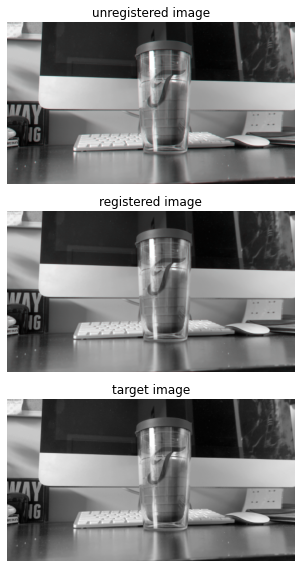

frame22.jpg


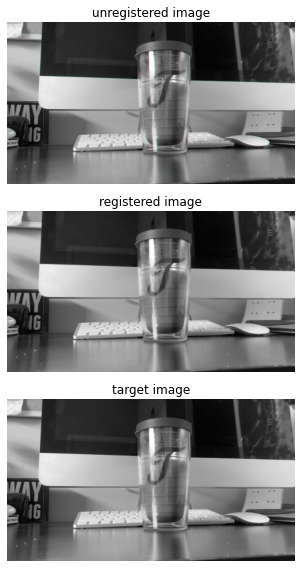

frame23.jpg


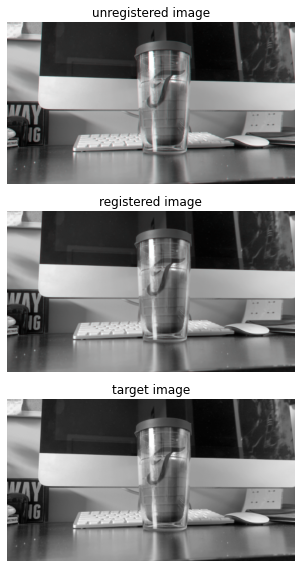

frame24.jpg


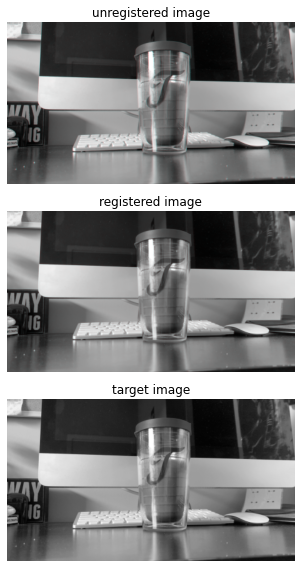

frame25.jpg


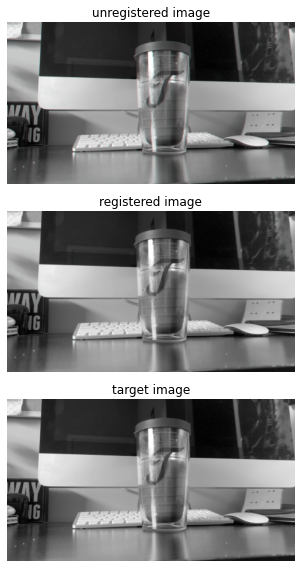

frame26.jpg


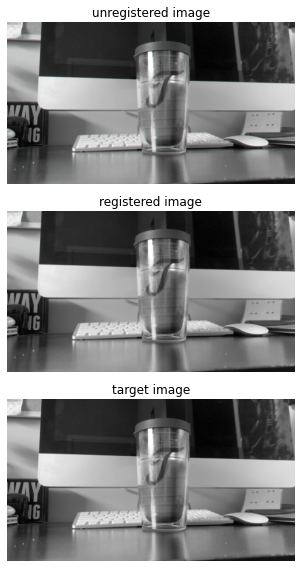

frame27.jpg


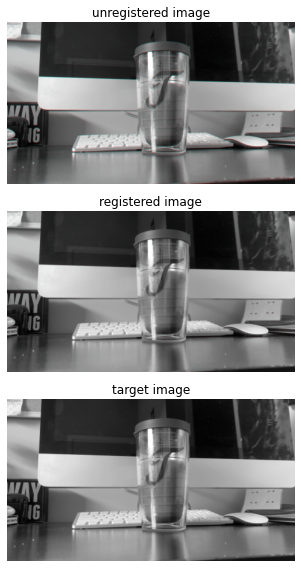

frame28.jpg


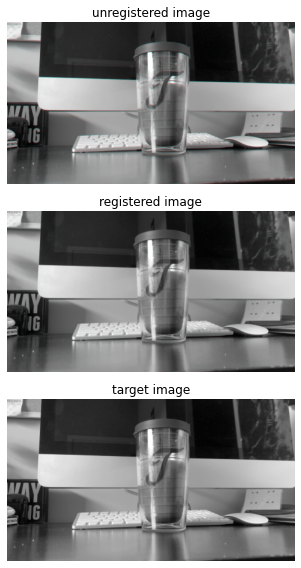

frame29.jpg


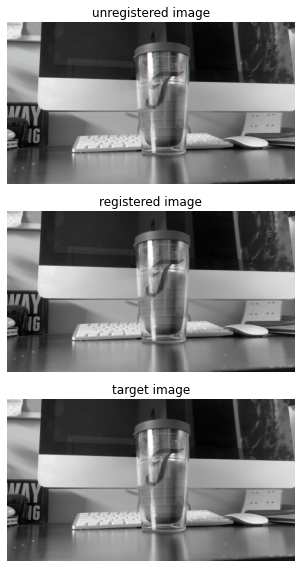

frame30.jpg


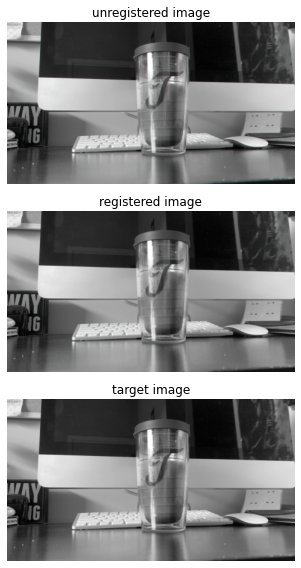

frame31.jpg


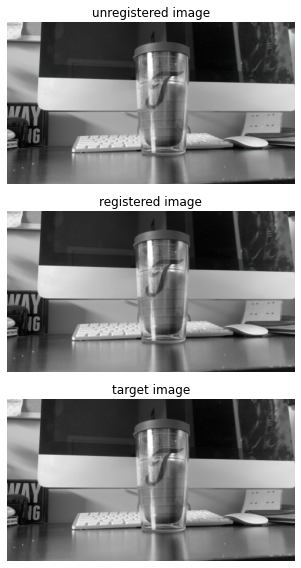

frame32.jpg


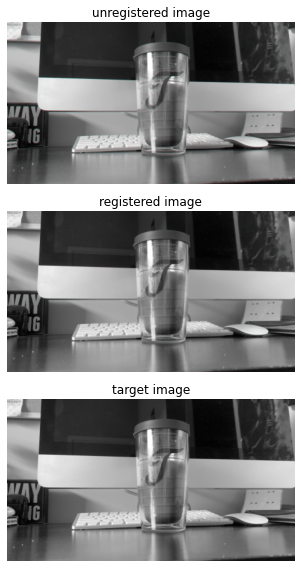

frame33.jpg


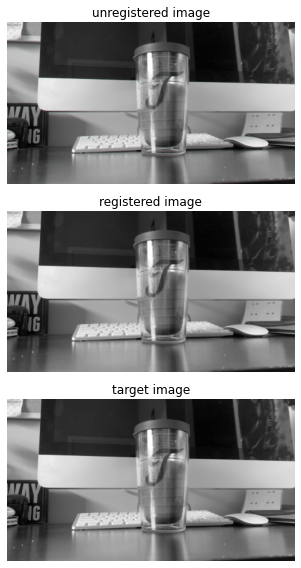

frame34.jpg


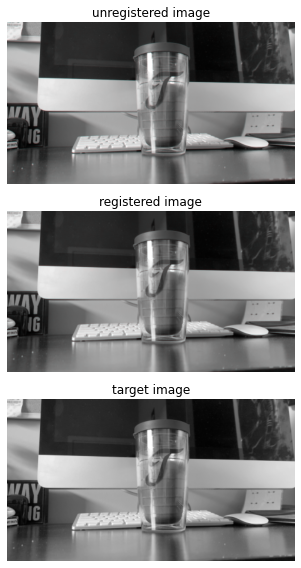

frame35.jpg


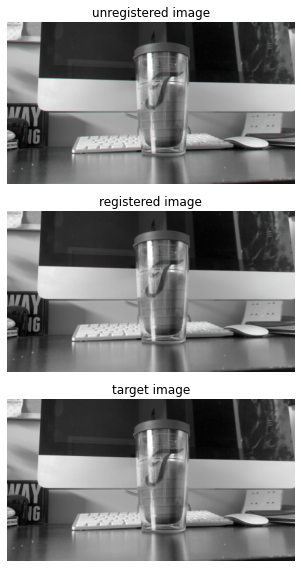

frame36.jpg


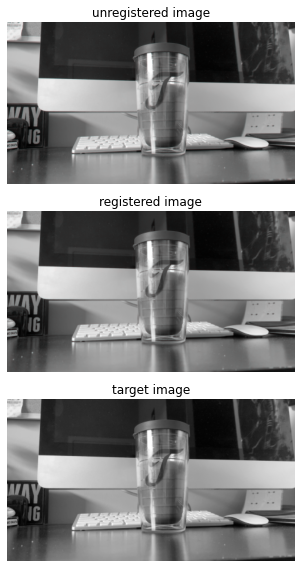

frame37.jpg


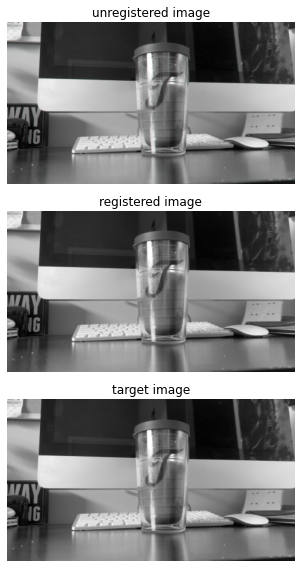

frame38.jpg


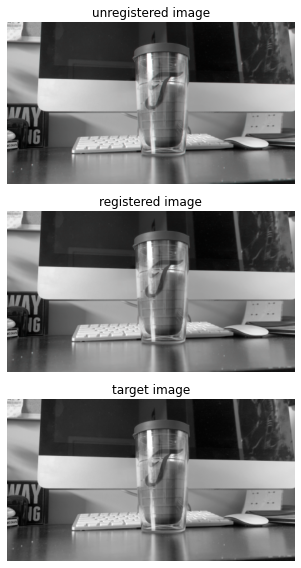

frame39.jpg


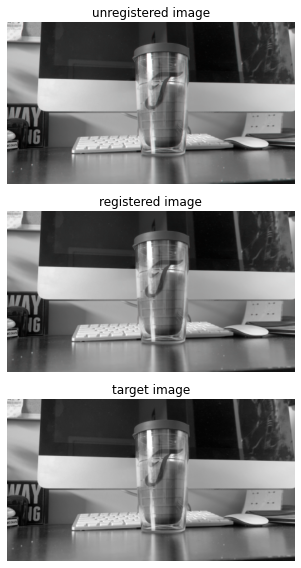

frame40.jpg


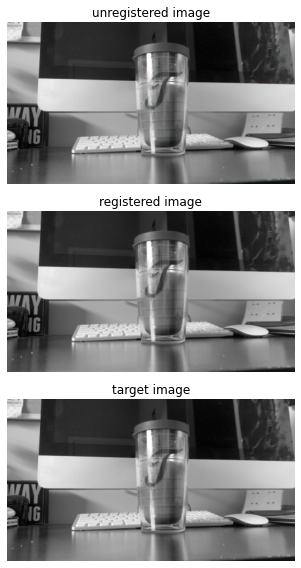

frame41.jpg


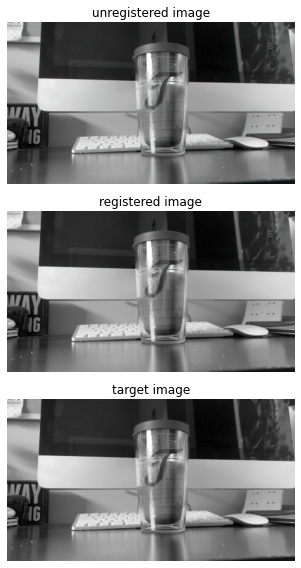

frame42.jpg


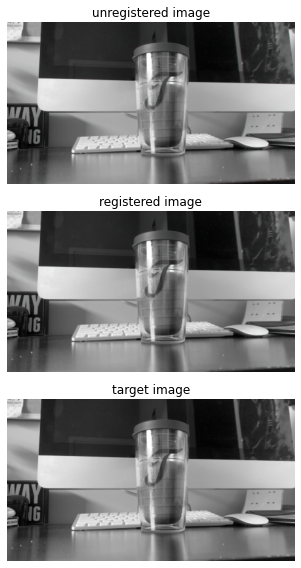

frame43.jpg


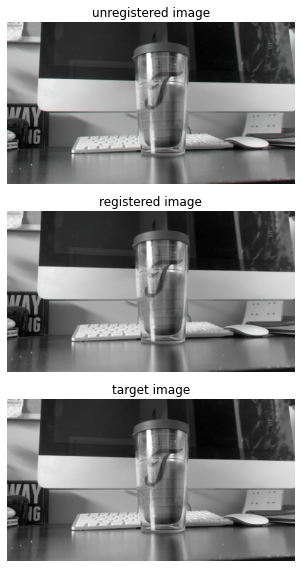

frame44.jpg


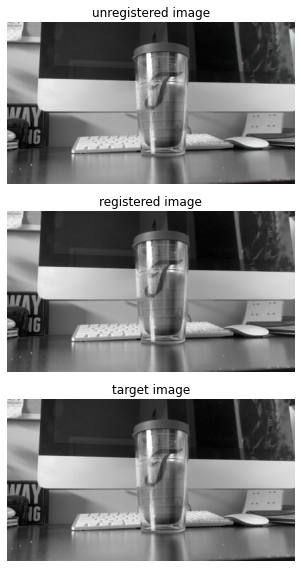

frame45.jpg


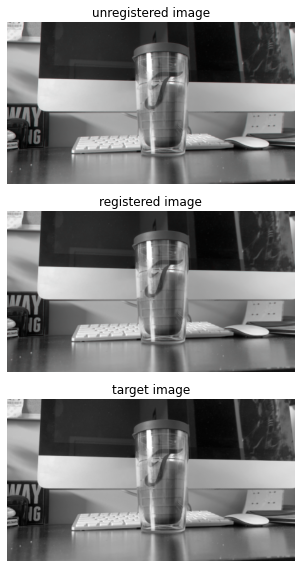

frame46.jpg


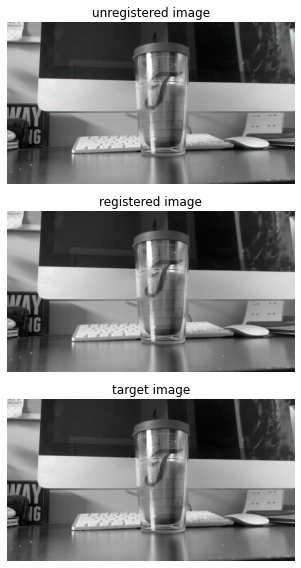

frame47.jpg


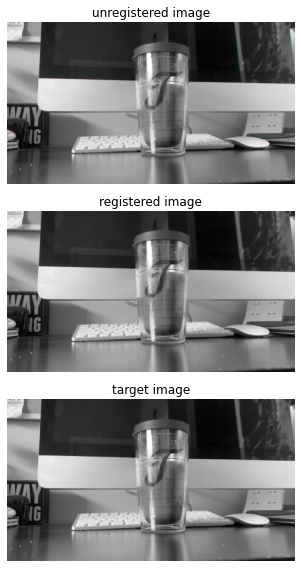

frame48.jpg


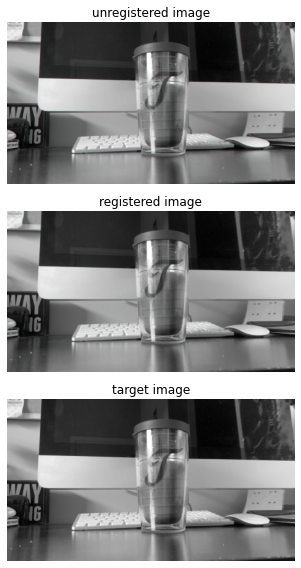

frame49.jpg


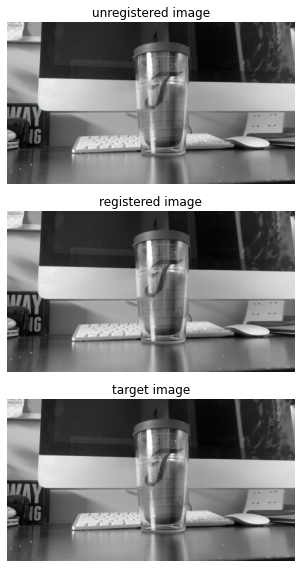

frame50.jpg


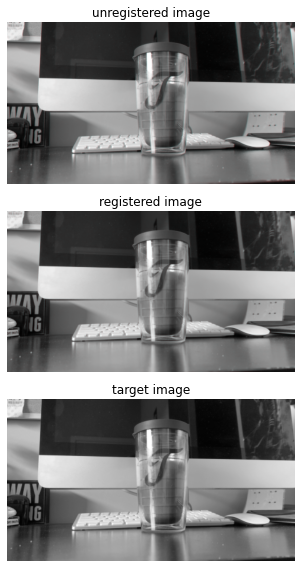

frame51.jpg


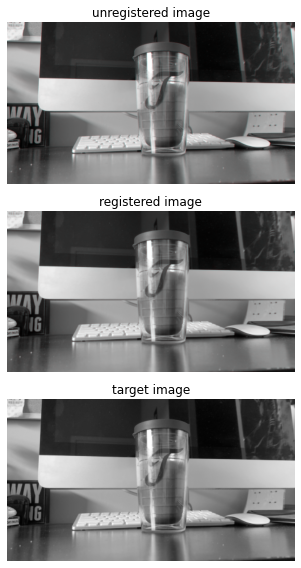

frame52.jpg


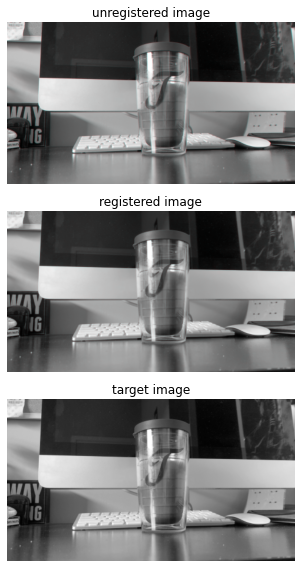

frame53.jpg


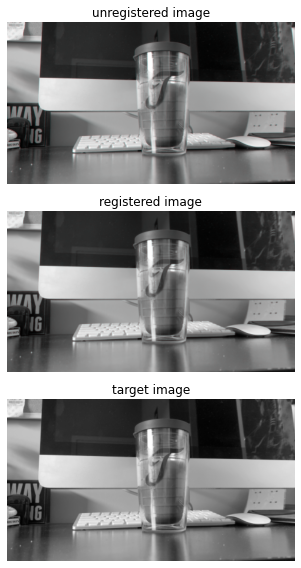

frame54.jpg


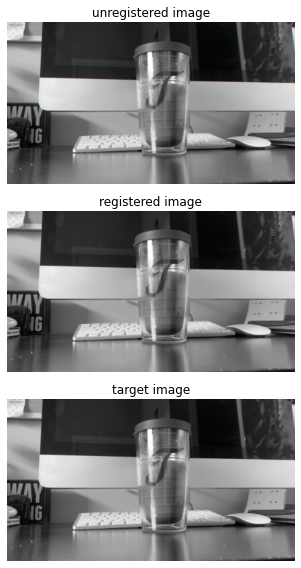

frame55.jpg


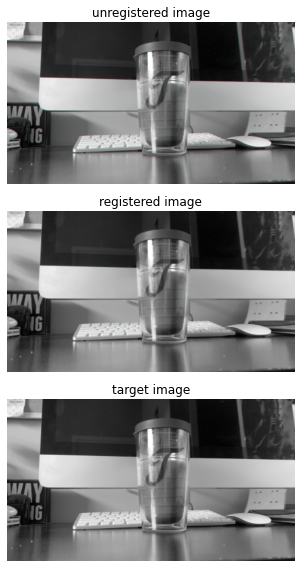

frame56.jpg


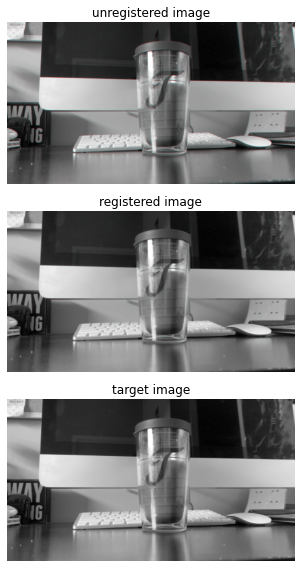

frame57.jpg


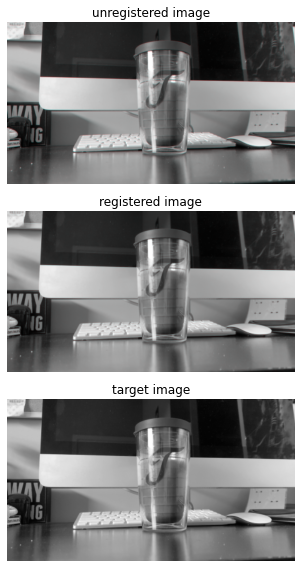

frame58.jpg


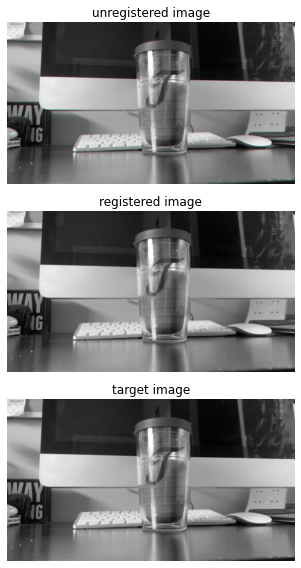

frame59.jpg


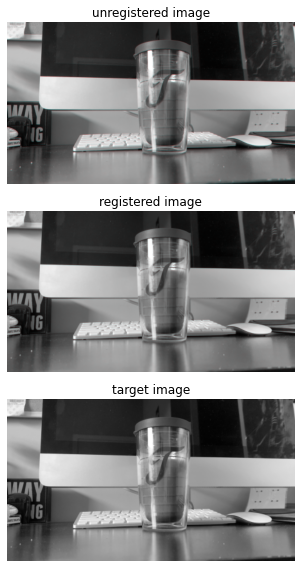

frame60.jpg


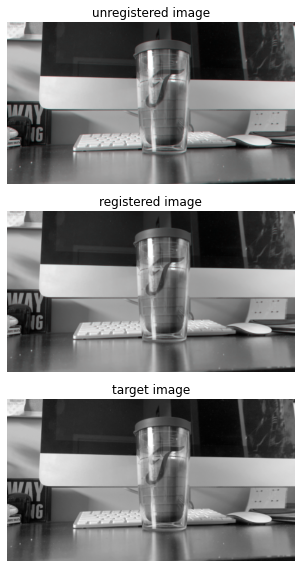

frame61.jpg


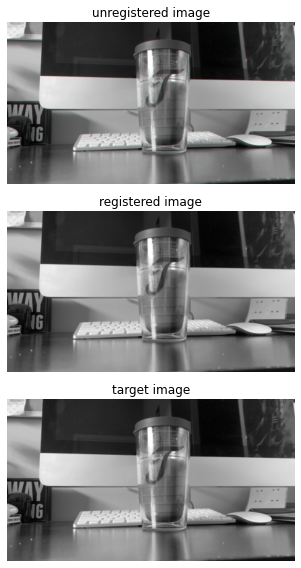

frame62.jpg


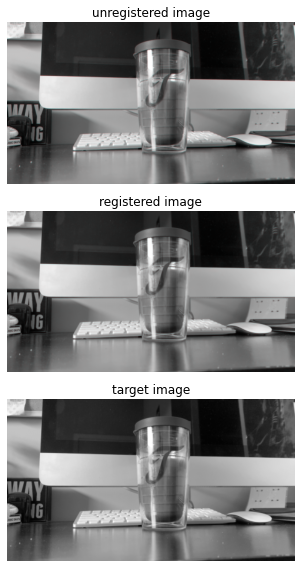

frame63.jpg


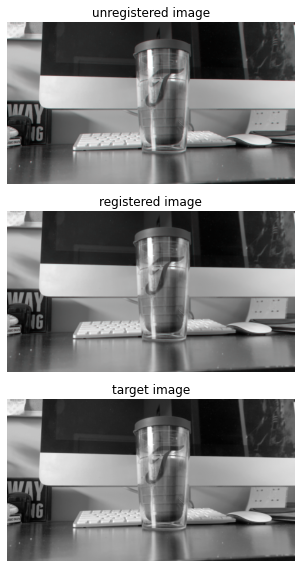

frame64.jpg


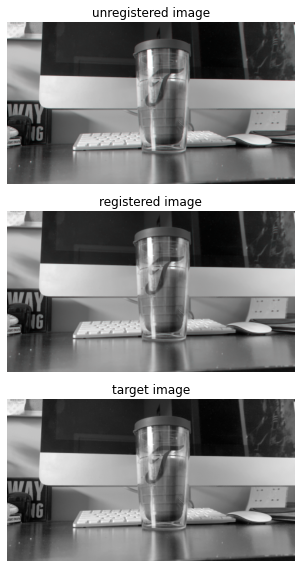

frame65.jpg


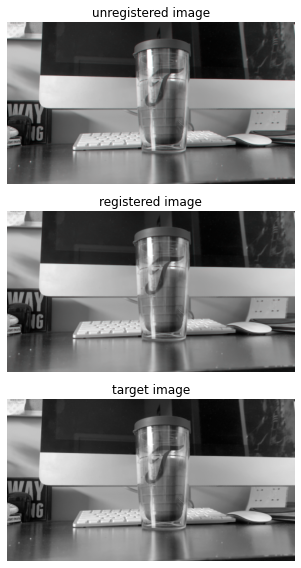

frame66.jpg


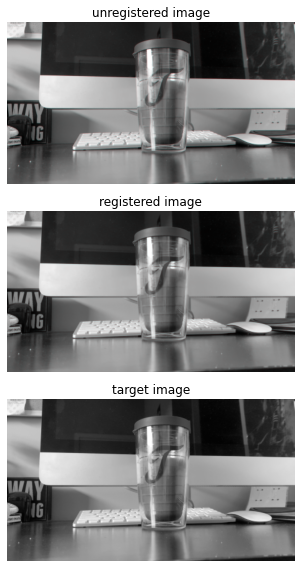

frame67.jpg


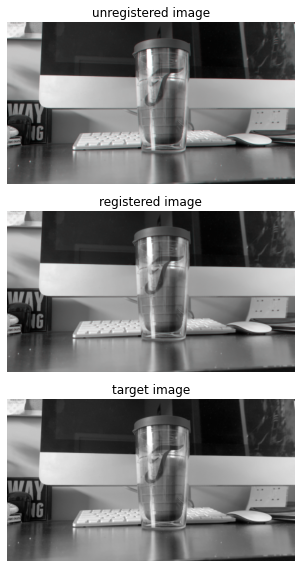

frame68.jpg


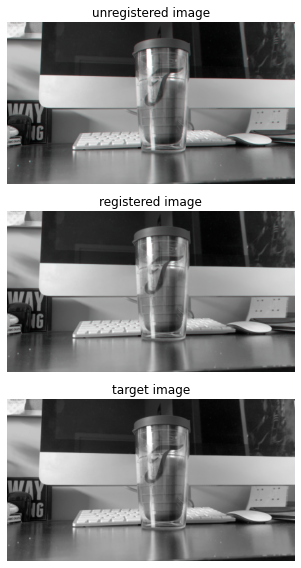

frame69.jpg


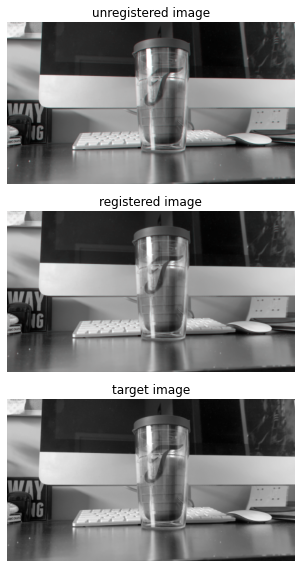

frame70.jpg


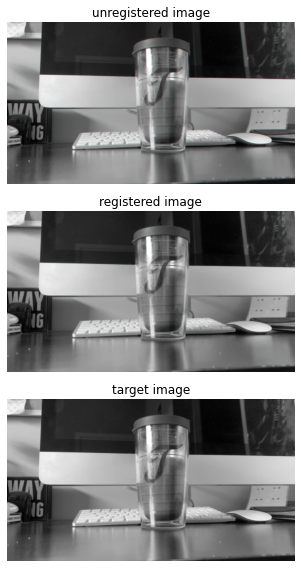

frame71.jpg


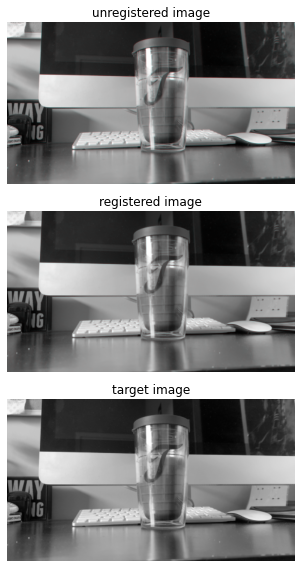

frame72.jpg


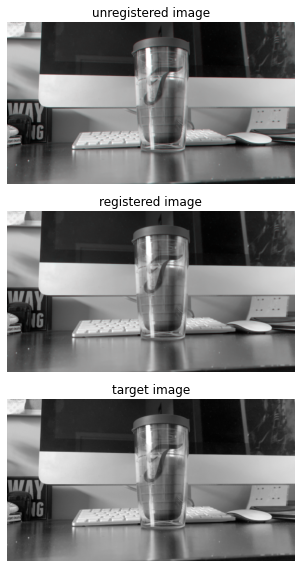

frame73.jpg


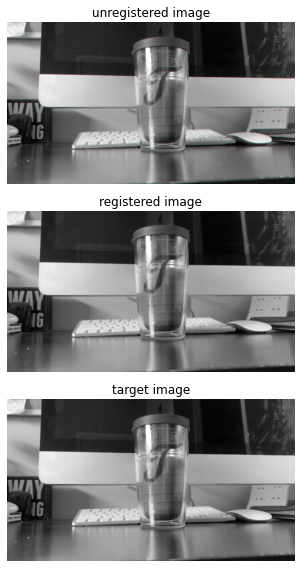

frame74.jpg


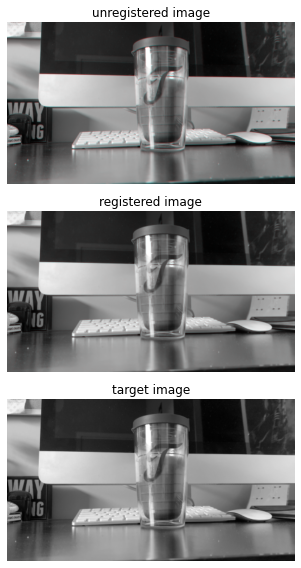

frame75.jpg


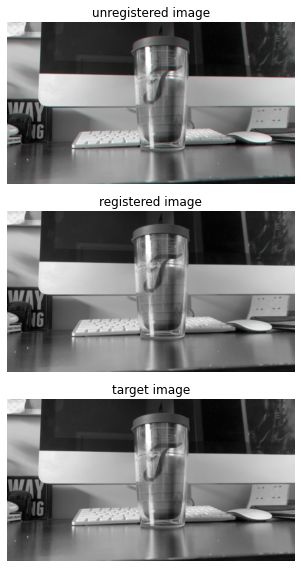

frame76.jpg


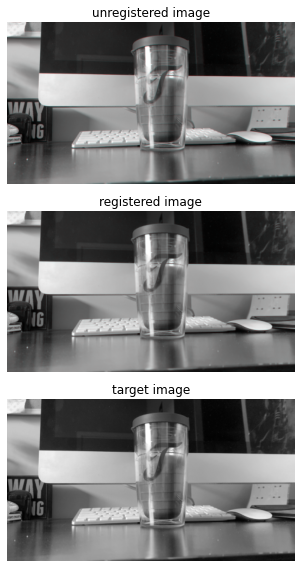

frame77.jpg


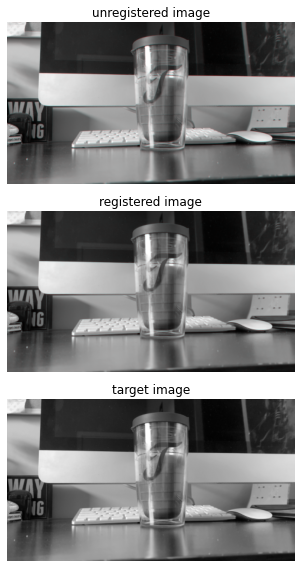

frame78.jpg


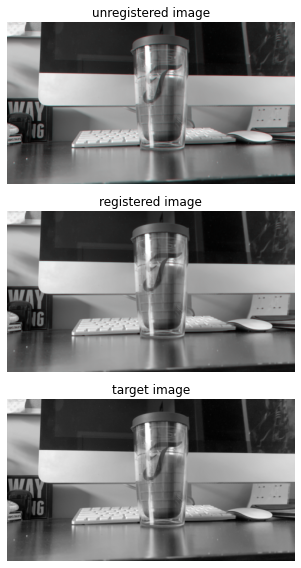

frame79.jpg


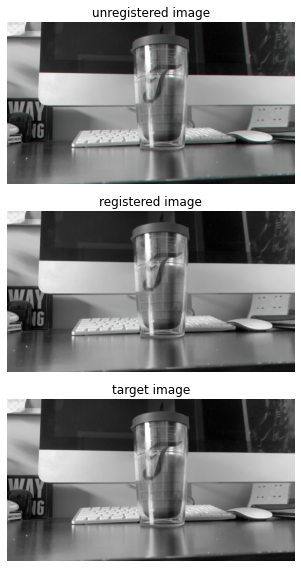

frame80.jpg


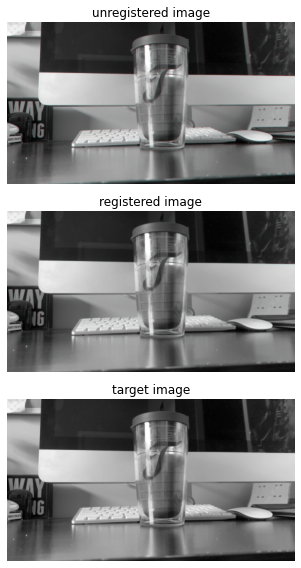

frame81.jpg


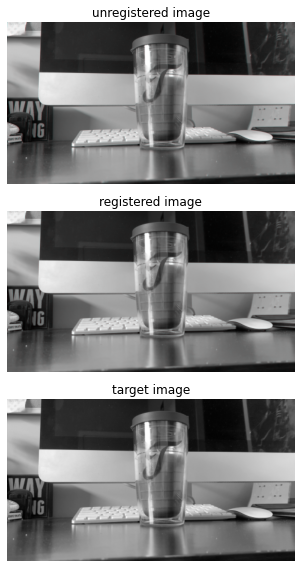

frame82.jpg


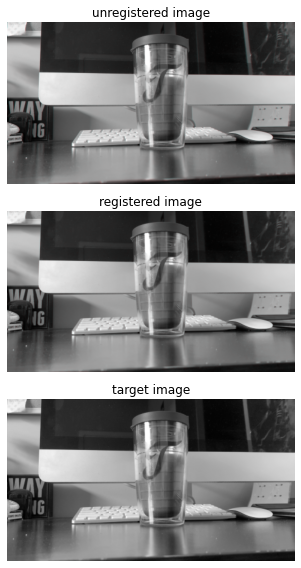

frame83.jpg


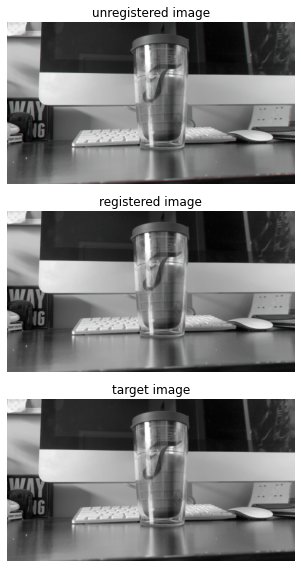

frame84.jpg


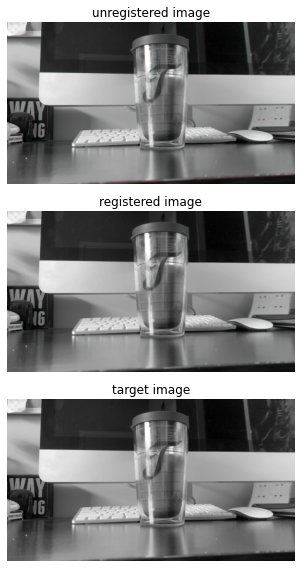

frame85.jpg


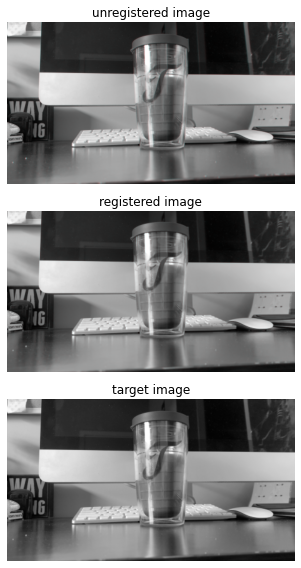

frame86.jpg


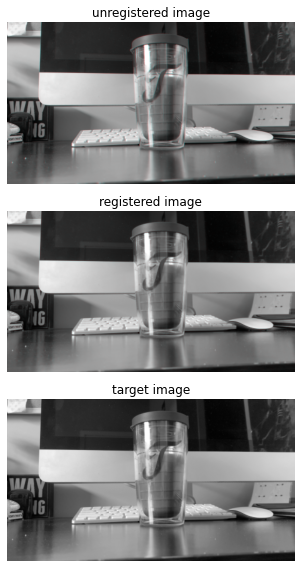

frame87.jpg


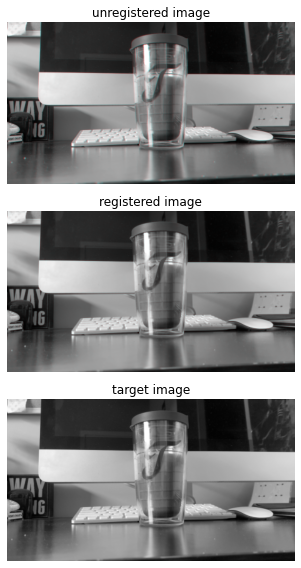

frame88.jpg


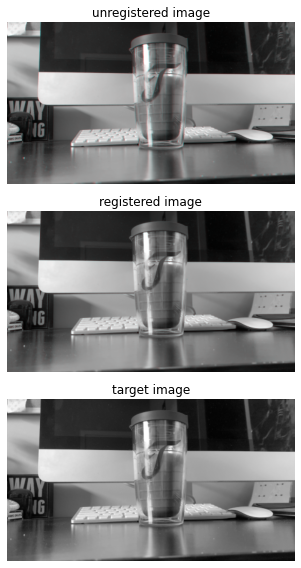

frame89.jpg


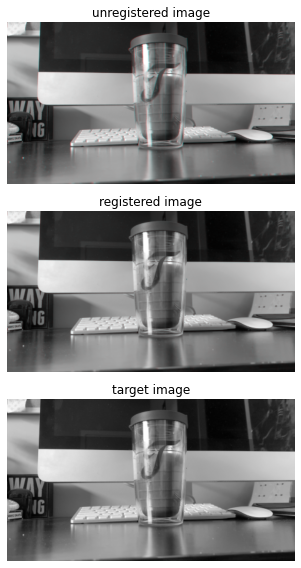

frame90.jpg


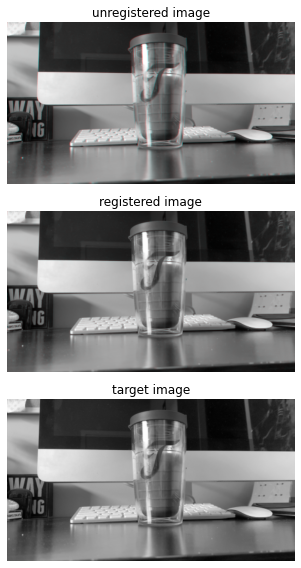

frame91.jpg


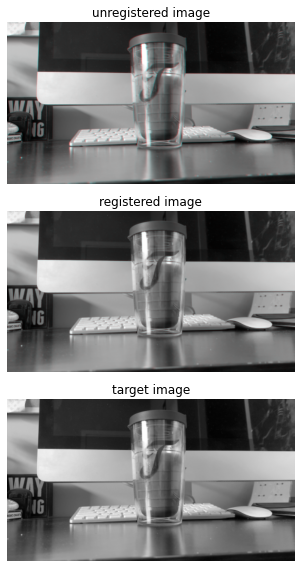

frame92.jpg


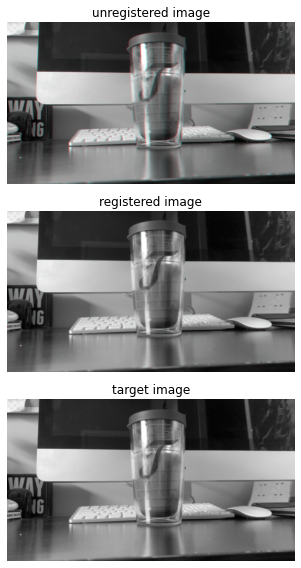

frame93.jpg


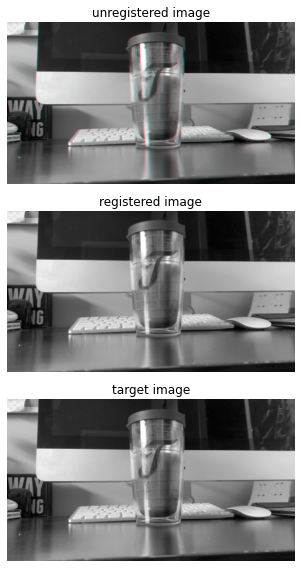

frame94.jpg


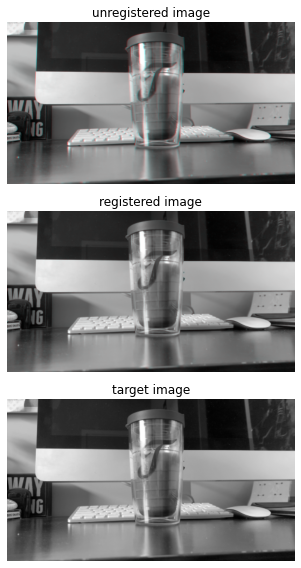

frame95.jpg


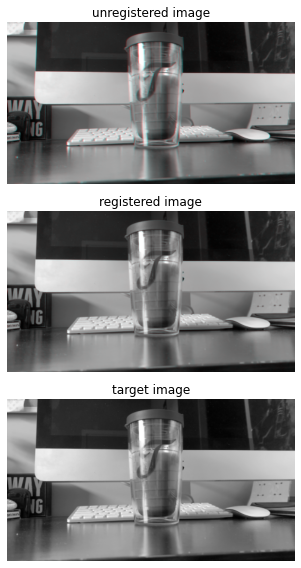

frame96.jpg


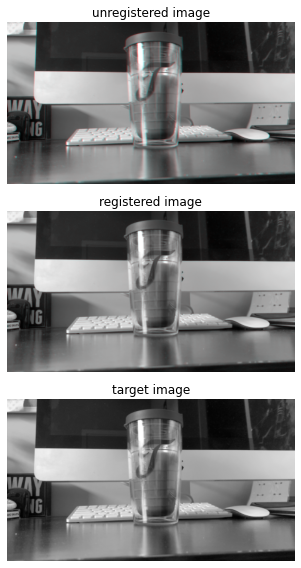

frame97.jpg


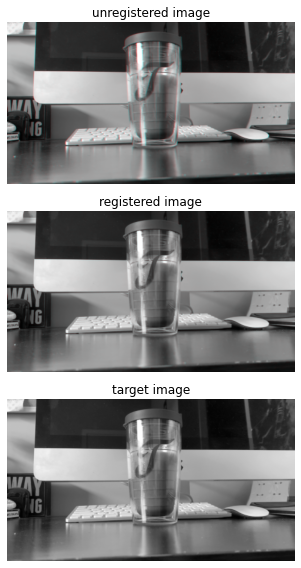

frame98.jpg


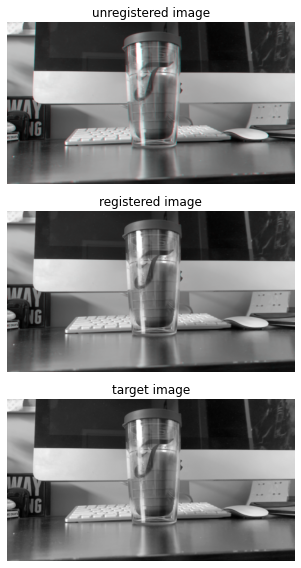

frame99.jpg


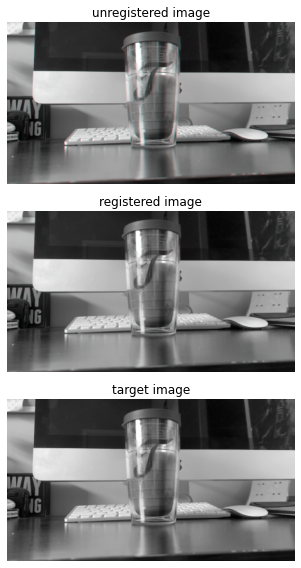

frame100.jpg


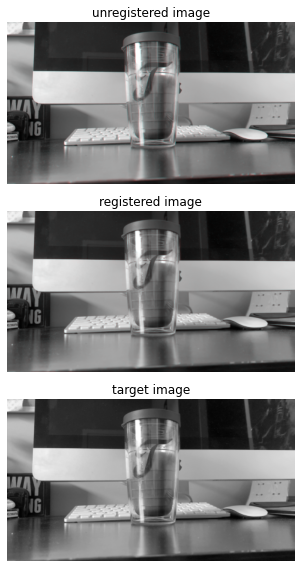

In [8]:
#limiting to 100 frames for size optimization of the output
# reapeating the above steps for all the frames
for i in range(len(frames)-242):
    print("frame{}.jpg".format(i))
    frame0 = imread('./images/'+frames[i])
    frame1 = imread('./images/'+frames[i+1])
    assert frame0.shape == frame1.shape
    frame0 = resize(frame0, (frame0.shape[0]//4, frame0.shape[1]//4), anti_aliasing=True)
    frame1 = resize(frame1, (frame1.shape[0]//4, frame1.shape[1]//4), anti_aliasing=True)
    frame0 = rgb2gray(frame0)
    frame1 = rgb2gray(frame1)
    v,u = optical_flow_ilk(frame0, frame1)
    nr, nc = frame0.shape
    row_coords, col_coords = np.meshgrid(np.arange(nr), np.arange(nc), indexing='ij')
    frame1_warp = warp(frame1, np.array([row_coords + v, col_coords + u]), mode='edge')
    seq_im = np.zeros((nr, nc, 3))
    seq_im[...,0] = frame1
    seq_im[...,1] = frame0
    seq_im[...,2] = frame0

    reg_im = np.zeros((nr, nc, 3))
    reg_im[:,:,0] = frame1_warp
    reg_im[:,:,1] = frame0
    reg_im[:,:,2] = frame0

    target_im = np.zeros((nr, nc, 3))
    target_im[:,:,0] = frame0
    target_im[:,:,1] = frame0
    target_im[:,:,2] = frame0

    #show the result

    fig, (ax0, ax1, ax2) = plt.subplots(3, 1, figsize=(20, 8))

    ax0.imshow(seq_im)
    ax0.set_title('unregistered image')
    ax0.set_axis_off()

    ax1.imshow(reg_im)
    ax1.set_title('registered image')
    ax1.set_axis_off()

    ax2.imshow(target_im)
    ax2.set_title('target image')
    ax2.set_axis_off()

    fig.tight_layout()
    plt.show()

In [1]:
capture = cv.VideoCapture("IMG_2607.MOV")

while capture.isOpened():
    # to read frame by frame
    _, img_1 = capture.read()
    _, img_2 = capture.read()

    # find difference between two frames
    diff = cv.absdiff(img_1, img_2)

    # to convrt the frame to grayscale
    diff_gray = cv.cvtColor(diff, cv.COLOR_BGR2GRAY)

    # apply some blur to smoothen the frame
    diff_blur = cv.GaussianBlur(diff_gray, (5, 5), 0)

    # to get the binary image
    _, thresh_bin = cv.threshold(diff_blur, 20, 255, cv.THRESH_BINARY)

    # to find contours
    contours, hierarchy = cv.findContours(thresh_bin, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

    # to draw the bounding box when the motion is detected
    for contour in contours:
        x, y, w, h = cv.boundingRect(contour)
        if cv.contourArea(contour) > 300:
            cv.rectangle(img_1, (x, y), (x+w, y+h), (0, 255, 0), 2)
    # cv2.drawContours(img_1, contours, -1, (0, 255, 0), 2)

    # display the output
    cv.imshow("Detecting Motion...", img_1)
    if cv.waitKey(100) == 13:
        exit()

NameError: name 'cv' is not defined